# 49 Years of Music - A Data Driven Study of Lyrics
## Using a combination of web scraping, API calls, and Data Science to map out changes in lyrics from 1978 to 2017

## Background
This notebook originally started out as an argument about whether popular music was better or worse today than it was several years ago. There are several theories on why certain time ranges of music resonate with us, which can definitely affect our impartiality when it comes to something as subjective as music and the arts in general. There’s an excellent Slate article on Neural Nostalgia here that talks about it in detail.

For me though, as a data driven person, I thought some level of quantitative analysis could be brought to bear. If I was able to go through music from 1970 to 2018 and investigate the lyrics from a Natural Language Processing (NLP) perspective, what could I discover? I mean, I know late 90s music was the best music of all time (see Neural Nostalgia article above), but how could I prove/disprove that? How could I measure something so subjective?

I also wanted to provide other researchers/data scientists/hobbyists with some examples of how open source web-page based data could be collected, structured, and then used to feed API calls. Further I wanted to show how one could use SpaCy to tokenize the lyrics so they could be fed through a trained ANN. I used Requests, BeautifulSoup, and SpaCy for collection and data preparation tasks, matplotlib and seaborn for the visualizations, and Keras with Tensorflow (GPU) to train the ANN and then predict with it.

## Understanding the  ~~Hypothesis~~ "Business" Problem:
After much more arguing, we came up with the following measurements that would be tested against lyrics to see how they’ve changed over a 49 year period:

* The total number of words per song as a measure of complexity.
* The change in most frequent nouns per year.
* Use of adverbs per year.
* The number of profane/controversial words (which in itself is subjective) appearing in songs per year.
* The level of aggression/hostility in the songs (we’ll build a Keras sequential model for this task).

## Understanding the Data

### The Seeds
Firstly, I went to billboard.com and looked for a representative list of all songs from a given year. I found that there's a top 100 list that goes back to 1970 (thus our article title) so I decided to use that as a baseline for grabbing song titles and artists to populate our initial list.

### The Lyrics
I then took the data that we got from billboard.com and ran API look ups at genius.com to extract the lyric information possible for each song. Some of titles/artists don't match up exactly, so we'll get some misses every year. But we still should be able to get some solid representative data across each year. I put the resulting combination of song titles, artists, and lyrics into a pandas dataframe.

## Preparing the Data
For data preparation, i used a combination of set and .unique to find the total word counts and unique words, and then [SpaCy](www.spacy.io) to extract the following tokens:
* Verbs
* Adverbs
* Nouns
* Corpus (removal of stop words and punction, making all words lower case)

The resulting data gets stored in a dataframe that is then used for modelling.

## Modelling the Data

The prepped data is assessed/modeled a bit in the understanding phase, where we get word counts and overall data coverage, but the key part here is in the [Aggression Classifier](https://github.com/sharpie-007/dataAndMusic/blob/master/Aggression%20Classifier.ipynb) notebook. We use this notebook to create our aggression classifier and evaluate it, getting to around 79.9% accurate.

## Deploying the Model

I then load the model into this notebook and deploy it against the song lyrics to evaluate them for aggressiveness.

## Conclusions
I revisited the ~~hypothesis~~ Business Understanding/problem to see what we’ve learned.

* Word quantity and language complexity has increased from 1970 to 2018.
 * Supported. We can see that by measure of frequency and uniqueness that the lyrics have become complex.
* Several common nouns appear throughout the entire spectrum of lyrics, but the most common ones change over time.
 * Supported. We now know that Love lost value in 1996, but never truly went away. And Baby had it’s best years in 1993 and 2012.
* Adverbs have become more aggressive/forward over time.
 * Not Supported. I didn’t even graph this because the data was so inconclusive. Feel free to take a look at this git repo and explore.
* Profanity in Lyrics has increased significantly in the past 20 years (1998 to 2018).
 * Supported. With 2018 being the most profane year on record.
* Songs are more aggressive now than they were in the 1970s.
 * Possibly Supported. We’re suspicious of the accuracy of our ANN (82% on it’s own data) vs the Lyrics dataset, but it does support the need for more research.

# The Code
## Imports

In [1]:
import pandas as pd
import numpy as np
import requests
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import HTML, display
from bs4 import BeautifulSoup
from nltk.tokenize import RegexpTokenizer
import lyricsgenius as genius
import sys
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import string
from nltk.stem import PorterStemmer
from datetime import datetime
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import spacy
from collections import Counter
from os import path
from PIL import Image
from keras.models import model_from_json
import pickle
pd.options.mode.chained_assignment = None
display(HTML("<style>.container { width:100% !important; }</style>"))
%config InlineBackend.figure_format = 'png'

C:\Users\sharp\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


## Functions

In [2]:
def collect_songs_from_billboard(start_year,end_year):
    '''This function takes in a start year and and end year, then iterates through each year to 
    pull song data from billboard or bobborst as needed. Then it uses beautiful soup to clean
    the data. Finally it stores the cleaned data in a dataframe and returns it
    
    Parameters:
    
    start_year (int): the year to start at.
    end_year (int): the year to end at.
    Returns: 
    
    dataframe.
    '''
    
    years = np.arange(start_year, end_year + 1).astype(int)
    dataset = pd.DataFrame()
    url_list = []
    all_years = pd.DataFrame()
    ### Billboard doesn't have it's own complete results from 1970 to 2016,
    ### so we'll use bobborst.com as our primary and collect from billboard as needed
    alternate_site_collection_range = np.arange(start_year, 2017)
    #URL Constructor
    for i in range (0, len(years)):
        url_list.append("https://www.billboard.com/charts/year-end/" + str(years[i]) + "/hot-100-songs")      
    for i in range(0, len(url_list)):
        if years[i] in alternate_site_collection_range:
            sys.stdout.write("\r" + "Collecting Songs from " +str(years[i]) + " via http://www.bobborst.com")
            sys.stdout.flush()    
            url = "http://www.bobborst.com/popculture/top-100-songs-of-the-year/?year=" + str(years[i])
            page = requests.get(url)
            soup = BeautifulSoup(page.content, "html.parser")
            table = soup.find('table', {'class': 'sortable alternate songtable'})
            rows = table.find_all('tr')
            for j in range(2,102):
                columns = rows[j].find_all('td')
                #print(columns)
                row = {
                    "Rank": columns[0].get_text(strip=True),
                    "Artist": columns[1].get_text(strip=True),
                    "Song Title": columns[2].get_text(strip=True),
                    "Year": years[i]
                }
                dataset = dataset.append(row, ignore_index=True)
            
        else:
            sys.stdout.write("\r" + "Collecting Songs from " +str(years[i]) + " via https://www.billboard.com")
            sys.stdout.flush()
            url = "https://www.billboard.com/charts/year-end/" + str(years[i]) + "/hot-100-songs"
            page = requests.get(url)
            soup = BeautifulSoup(page.content, "html.parser")
            all_ranks = soup.find_all("div", class_="ye-chart-item__rank")
            all_titles = soup.find_all('div', class_="ye-chart-item__title")
            all_artists = soup.find_all("div", class_="ye-chart-item__artist")
            for j in range (0, len(all_ranks)):
                row = {
                    "Rank": all_ranks[j].get_text(strip=True),
                    "Song Title": all_titles[j].get_text(strip=True),
                    "Artist": all_artists[j].get_text(strip=True),
                    "Year": years[i]
                }
                dataset = dataset.append(row, ignore_index=True)
    dataset['Year'] = dataset['Year'].astype(int)
    return dataset
    

In [3]:
def plot_year_counts(dataset, X, y, title):
    '''Function to plot the year count summaries.
    
    Parameters:

    dataset (dataframe): pandas dataframe
    X (string): the x axis column
    y (string): the y axis column
    title (string): the title of the chart
    
    Outputs a matplotlib lineplot
    '''
    characteristics = dataset.groupby(X).count()
    mpl.rcParams['figure.figsize'] = (35,10,)
    #all_songs.groupby('Year').count().plot(kind='bar')
    sns.barplot(y=characteristics[y], x=characteristics.index)
    plt.title(title)
    plt.ylabel("Number of Songs")
    plt.xticks(rotation=90)


In [4]:
def add_spacy_data(dataset, feature_column):
    '''
    Grabs the verb, adverb, noun, and stop word Parts of Speech (POS) 
    tokens and pushes them into a new dataset. returns an 
    enriched dataset.
    
    Parameters:
    
    dataset (dataframe): the dataframe to parse
    feature_column (string): the column to parse in the dataset.
    
    Returns: 
    dataframe
    '''
    
    verbs = []
    nouns = []
    adverbs = []
    corpus = []
    nlp = spacy.load('en_core_web_sm')
    ##
    for i in range (0, len(dataset)):
        print("Extracting verbs and topics from record {} of {}".format(i+1, len(dataset)), end = "\r")
        song = dataset.iloc[i][feature_column]
        doc = nlp(song)
        spacy_dataframe = pd.DataFrame()
        for token in doc:
            if token.lemma_ == "-PRON-":
                    lemma = token.text
            else:
                lemma = token.lemma_
            row = {
                "Word": token.text,
                "Lemma": lemma,
                "PoS": token.pos_,
                "Stop Word": token.is_stop
            }
            spacy_dataframe = spacy_dataframe.append(row, ignore_index = True)
        verbs.append(" ".join(spacy_dataframe["Lemma"][spacy_dataframe["PoS"] == "VERB"].values))
        nouns.append(" ".join(spacy_dataframe["Lemma"][spacy_dataframe["PoS"] == "NOUN"].values))
        adverbs.append(" ".join(spacy_dataframe["Lemma"][spacy_dataframe["PoS"] == "ADV"].values))
        corpus_clean = " ".join(spacy_dataframe["Lemma"][spacy_dataframe["Stop Word"] == False].values)
        corpus_clean = re.sub(r'[^A-Za-z0-9]+', ' ', corpus_clean)   
        corpus.append(corpus_clean)
    dataset['Verbs'] = verbs
    dataset['Nouns'] = nouns
    dataset['Adverbs'] = adverbs
    dataset['Corpus'] = corpus
    return dataset

In [5]:
def prep_corpus(raw_string):
    '''Single use of add_spacy_data to enable pipelining 
    data into predictions
    
    Parameters:
    raw_string (string): String to be parsed
    
    Returns:
    parsed string
    '''

    verbs = []
    nouns = []
    adverbs = []
    corpus = []
    nlp = spacy.load('en_core_web_sm')

    doc = nlp(raw_string)
    spacy_dataframe = pd.DataFrame()
    for token in doc:
        if token.lemma_ == "-PRON-":
                lemma = token.text
        else:
            lemma = token.lemma_
        row = {
            "Word": token.text,
            "Lemma": lemma,
            "PoS": token.pos_,
            "Stop Word": token.is_stop
        }
        spacy_dataframe = spacy_dataframe.append(row, ignore_index = True)
    verbs.append(" ".join(spacy_dataframe["Lemma"][spacy_dataframe["PoS"] == "VERB"].values))
    nouns.append(" ".join(spacy_dataframe["Lemma"][spacy_dataframe["PoS"] == "NOUN"].values))
    adverbs.append(" ".join(spacy_dataframe["Lemma"][spacy_dataframe["PoS"] == "ADV"].values))
    corpus_clean = " ".join(spacy_dataframe["Lemma"][spacy_dataframe["Stop Word"] == False].values)
    corpus_clean = re.sub(r'[^A-Za-z0-9]+', ' ', corpus_clean)   

    return corpus_clean

In [6]:
def wordcloud(text, max_words):
    '''
    Wrapper around Wordcloud that increases quality, picks a specific font,
    and puts it on a white background
    '''
    
    wordcloud = WordCloud(font_path='C:\WINDOWS\FONTS\PERTILI.TTF',
                          width = 4000,
                          height = 3000,
                          background_color="white",
                          max_words = max_words                          
                         ).generate(text)
    plt.figure(figsize=(40,25))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad=0)
    plt.show()
    return;

In [209]:
def map_popular_terms(dataset, feature_column, year_column):
    '''Function that counts the frequency of occurences of words in a dataset
    column. Returns a new dataset with those frequencies'''
    frequencies = pd.DataFrame()
    years = dataset[year_column].unique().tolist()
    for i in range (0, len(years)):
        year_corpus = str(dataset[feature_column][dataset[year_column] == years[i]].tolist())
        tokens = year_corpus.split(" ")
        counts = Counter(tokens)
        frequencies = frequencies.append({
            "Year": years[i],
            "Most Common Terms": counts.most_common(n=100)
        }, ignore_index=True)
    frequencies['Year'] = frequencies['Year'].astype(int)
    return frequencies
    

In [8]:
def map_common_words(dataset):
    '''Maps common words from across multiple columns in a dataset to 
    identify terms that show up in all columns. Normally used with the 
    outputs of map_popular_terms. returns the common words'''
    common_words = []
    for words in dataset['Most Common Terms'][0]:
        common_words.append(words[0])

    for i in range (0, len(dataset)):
        check_list = []
        year_list = dataset['Most Common Terms'][i]
        for words in year_list:
            check_list.append(words[0])
        common_words = [x for x in common_words if x  in check_list]
    return common_words

In [9]:
def get_common_frequency(term_list, frequency_list):
    '''Finds the frequency of occurence of terms in a list and then
    returns them in a new dataframe organized by year'''
    common_word_frequency_per_year = pd.DataFrame()
    for i in range(0, len(term_list)):
        word_frequency = []
        for j in range(0, len(frequency_list)):
            current_year = frequency_list['Year'][j]
            current_year_terms = frequency_list['Most Common Terms'][j]
            for words in current_year_terms:
                    if term_list[i] in words[0]:
                        word_frequency.append(words[1])
                        #print(words[1])
                        break
        current_word = term_list[i]
        common_word_frequency_per_year[str(current_word)] = word_frequency
    common_word_frequency_per_year["Year"] = np.arange(1970,2019)
    common_word_frequency_per_year = common_word_frequency_per_year.set_index("Year")
    return common_word_frequency_per_year

## Data Collection/Understanding

In [52]:
all_songs = collect_songs_from_billboard(1970, 2018)

In [11]:
display(all_songs.head(5))
display(all_songs.tail(5))
display(all_songs.shape)

,Artist,Rank,Song Title,Year
0,Simon and Garfunkel,1,Bridge Over Troubled Water,1970
1,Carpenters,2,(They Long To Be) Close To You,1970
2,Guess Who,3,American Woman / No Sugar Tonight,1970
3,B.J. Thomas,4,Raindrops Keep Fallin' On My Head,1970
4,Edwin Starr,5,War,1970


,Artist,Rank,Song Title,Year
4895,Luke Combs,96,One Number Away,2018
4896,Rae Sremmurd & Juicy J,97,Powerglide,2018
4897,Dua Lipa,98,IDGAF,2018
4898,J Balvin & Willy William Featuring Beyonce,99,Mi Gente,2018
4899,Imagine Dragons,100,Believer,2018


(4900, 4)

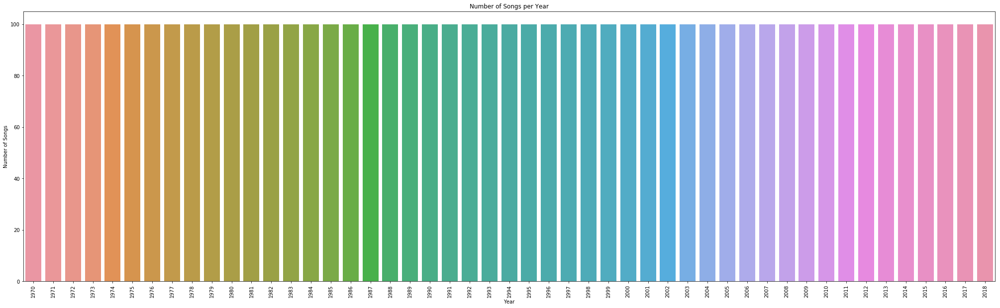

In [14]:
plot_year_counts(all_songs, 'Year', 'Rank', "Number of Songs per Year")
plt.show()

### Collecting and Preparation Phase 1 - Lyrics and metadata via genius.com

Now that we've collected the core song information from Billboard, we need to collect the lyrics, which will make up the bulk of our analysis later on. You can register for a genius.com api key and access the documentation here: https://docs.genius.com/.
For this next part, I didn't modularize it because the characteristics we very specific, as such it's just a for loop that iterates through the songs dataset we collected from Billboard.
Several of the song titles/artists don't match up exactly, so we've added some exception handling (see the try/except steps) to add nulls where we don't get results back from the API call.

This code can take 2+ hours to run, so I've added some status reporting to it to track the progress.

manual inspection tell us that we need to fix up some of the data to make it genius friendly. I've noted that:
* " and " is & on genius
* Beatles and Jackson 5 need to be prefaced with "The"

In [53]:
all_songs["Artist"][all_songs['Artist'] == "Jackson 5"] = "The Jackson 5"
all_songs["Artist"][all_songs['Artist'] == "Beatles"] = "The Beatles"

In [54]:
all_songs.head(20)

,Artist,Rank,Song Title,Year
0,Simon and Garfunkel,1,Bridge Over Troubled Water,1970
1,Carpenters,2,(They Long To Be) Close To You,1970
2,Guess Who,3,American Woman / No Sugar Tonight,1970
3,B.J. Thomas,4,Raindrops Keep Fallin' On My Head,1970
4,Edwin Starr,5,War,1970
5,Diana Ross,6,Ain't No Mountain High Enough,1970
6,The Jackson 5,7,I'll Be There,1970
7,Rare Earth,8,Get Ready,1970
8,The Beatles,9,Let It Be,1970
9,Freda Payne,10,Band Of Gold,1970


In [55]:
api = genius.Genius("YOUR API KEY HERE",sleep_time=0.01, verbose=False)

In [59]:
all_song_data = pd.DataFrame()
start_time = datetime.now()
print("Started at {}".format(start_time))
for i in range(0, len(all_songs)):
    rolling_pct = int((i/len(all_songs))*100)
    print(str(rolling_pct) + "% complete." + " Collecting Record " + str(i) +" of " +
          str(len(all_songs)) +". Year " + str(all_songs.iloc[i]['Year']) + "." + " Currently collecting " + 
          all_songs.iloc[i]['Song Title'] + " by " + all_songs.iloc[i]['Artist'] + " "*50, end="\r")
    song_title = all_songs.iloc[i]['Song Title']
    song_title = re.sub(" and ", " & ", song_title)
    artist_name = all_songs.iloc[i]['Artist']
    artist_name = re.sub(" and ", " & ", artist_name)

    try:
        song = api.search_song(song_title, artist=artist_name)
        #print(song)
        song_album = song.album
        song_album_url = song.album_url
        featured_artists = song.featured_artists
        song_lyrics = re.sub("\n", " ", song.lyrics) #Remove newline breaks, we won't need them.
        song_media = song.media
        song_url = song.url
        song_writer_artists = song.writer_artists
        song_year = song.year
    except:
        song_album = "null"
        song_album_url = "null"
        featured_artists = "null"
        song_lyrics = "null"
        song_media = "null"
        song_url = "null"
        song_writer_artists = "null"
        song_year = "null"
        
    row = {
        "Year": all_songs.iloc[i]['Year'],
        "Rank": all_songs.iloc[i]['Rank'],
        "Song Title": all_songs.iloc[i]['Song Title'],
        "Artist": all_songs.iloc[i]['Artist'],
        "Album": song_album,
        "Album URL": song_album_url,
        "Featured Artists": featured_artists,
        "Lyrics": song_lyrics,
        "Media": song_media,
        "Song URL": song_url,
        "Writers": song_writer_artists,
        "Release Date": song_year
    }
    all_song_data = all_song_data.append(row, ignore_index=True)
end_time = datetime.now()
print("\nCompleted at {}".format(start_time))
print("Total time to collect: {}".format(end_time - start_time))



Started at 2018-12-16 17:35:21.826217
Timeout raised and caught:ecord 4102 of 4900. Year 2011. Currently collecting Firework by Katy Perry                                                                                                                        
HTTPSConnectionPool(host='api.genius.com', port=443): Read timed out. (read timeout=5)
Timeout raised and caught:ecord 4529 of 4900. Year 2015. Currently collecting Hotline Bling by Drake                                                                                                        
HTTPSConnectionPool(host='api.genius.com', port=443): Read timed out. (read timeout=5)
Timeout raised and caught:ecord 4605 of 4900. Year 2016. Currently collecting Panda by Desiigner                                                                                                                                   
HTTPSConnectionPool(host='api.genius.com', port=443): Read timed out. (read timeout=5)
99% complete. Collecting Record 4899 of 4900. Y

In [60]:
all_song_data.head(5)

,Album,Album URL,Artist,Featured Artists,Lyrics,Media,Rank,Release Date,Song Title,Song URL,Writers,Year
0,Bridge Over Troubled Water,https://genius.com/albums/Simon-and-garfunkel/...,Simon and Garfunkel,[],[Verse 1] When you're weary Feeling small When...,[{'native_uri': 'spotify:track:6l8EbYRtQMgKOyc...,1,1970-01-26,Bridge Over Troubled Water,https://genius.com/Simon-and-garfunkel-bridge-...,"[{'api_path': '/artists/15474', 'header_image_...",1970.0
1,Close to You,https://genius.com/albums/Carpenters/Close-to-you,Carpenters,[],Why do birds suddenly appear Every time you ar...,[{'native_uri': 'spotify:track:79SE4x5ZROfEqaN...,2,1970-05-15,(They Long To Be) Close To You,https://genius.com/Carpenters-they-long-to-be-...,"[{'api_path': '/artists/412388', 'header_image...",1970.0
2,null,null,Guess Who,null,null,null,3,null,American Woman / No Sugar Tonight,null,null,1970.0
3,Raindrops Keep Fallin' on My Head,https://genius.com/albums/Bj-thomas/Raindrops-...,B.J. Thomas,[],Raindrops keep fallin' on my head And just lik...,[{'native_uri': 'spotify:track:7BSIoadwe5hNIO1...,4,None,Raindrops Keep Fallin' On My Head,https://genius.com/Bj-thomas-raindrops-keep-fa...,"[{'api_path': '/artists/412388', 'header_image...",1970.0
4,War & Peace,https://genius.com/albums/Edwin-starr/War-peace,Edwin Starr,[],"[Intro] (War, what is it good for?) Absolutely...",[{'native_uri': 'spotify:track:7bfWzWm54GVlb8X...,5,1970-06-10,War,https://genius.com/Edwin-starr-war-lyrics,"[{'api_path': '/artists/326091', 'header_image...",1970.0


Now that we've collected all this data, lets save it so we don't have to run collection again. We'll save it in CSV and JSON format.

In [61]:
all_song_data.to_csv("all_songs_data.csv")
all_song_data.to_json("all_song_data.json", orient='records')

Now lets load it up into a new dataset to ensure we're able to leverage our saved data going forward

In [62]:
loaded_song_dataset = pd.read_csv("all_songs_data.csv",index_col=0)

In [63]:
display(loaded_song_dataset.head())
display(loaded_song_dataset.tail())

,Album,Album URL,Artist,Featured Artists,Lyrics,Media,Rank,Release Date,Song Title,Song URL,Writers,Year
0,Bridge Over Troubled Water,https://genius.com/albums/Simon-and-garfunkel/...,Simon and Garfunkel,[],[Verse 1] When you're weary Feeling small When...,[{'native_uri': 'spotify:track:6l8EbYRtQMgKOyc...,1,1970-01-26,Bridge Over Troubled Water,https://genius.com/Simon-and-garfunkel-bridge-...,"[{'api_path': '/artists/15474', 'header_image_...",1970.0
1,Close to You,https://genius.com/albums/Carpenters/Close-to-you,Carpenters,[],Why do birds suddenly appear Every time you ar...,[{'native_uri': 'spotify:track:79SE4x5ZROfEqaN...,2,1970-05-15,(They Long To Be) Close To You,https://genius.com/Carpenters-they-long-to-be-...,"[{'api_path': '/artists/412388', 'header_image...",1970.0
2,NaN,NaN,Guess Who,NaN,NaN,NaN,3,NaN,American Woman / No Sugar Tonight,NaN,NaN,1970.0
3,Raindrops Keep Fallin' on My Head,https://genius.com/albums/Bj-thomas/Raindrops-...,B.J. Thomas,[],Raindrops keep fallin' on my head And just lik...,[{'native_uri': 'spotify:track:7BSIoadwe5hNIO1...,4,NaN,Raindrops Keep Fallin' On My Head,https://genius.com/Bj-thomas-raindrops-keep-fa...,"[{'api_path': '/artists/412388', 'header_image...",1970.0
4,War & Peace,https://genius.com/albums/Edwin-starr/War-peace,Edwin Starr,[],"[Intro] (War, what is it good for?) Absolutely...",[{'native_uri': 'spotify:track:7bfWzWm54GVlb8X...,5,1970-06-10,War,https://genius.com/Edwin-starr-war-lyrics,"[{'api_path': '/artists/326091', 'header_image...",1970.0


,Album,Album URL,Artist,Featured Artists,Lyrics,Media,Rank,Release Date,Song Title,Song URL,Writers,Year
4895,This One's For You,https://genius.com/albums/Luke-combs/This-one-...,Luke Combs,[],"[Verse 1] Are you sitting at home, all alone, ...","[{'provider': 'youtube', 'start': 0, 'type': '...",96,2016-09-29,One Number Away,https://genius.com/Luke-combs-one-number-away-...,"[{'api_path': '/artists/1225101', 'header_imag...",2018.0
4896,NaN,NaN,Rae Sremmurd & Juicy J,NaN,NaN,NaN,97,NaN,Powerglide,NaN,NaN,2018.0
4897,Dua Lipa,https://genius.com/albums/Dua-lipa/Dua-lipa,Dua Lipa,[],[Verse 1] You call me all friendly Tellin' me ...,[{'native_uri': 'spotify:track:76cy1WJvNGJTj78...,98,2017-06-02,IDGAF,https://genius.com/Dua-lipa-idgaf-lyrics,"[{'api_path': '/artists/1154177', 'header_imag...",2018.0
4898,NaN,NaN,J Balvin & Willy William Featuring Beyonce,NaN,NaN,NaN,99,NaN,Mi Gente,NaN,NaN,2018.0
4899,Evolve,https://genius.com/albums/Imagine-dragons/Evolve,Imagine Dragons,[],[Verse 1] First things first I'ma say all the ...,"[{'provider': 'youtube', 'start': 0, 'type': '...",100,2017-02-01,Believer,https://genius.com/Imagine-dragons-believer-ly...,"[{'api_path': '/artists/142215', 'header_image...",2018.0


### Preparation Phase 2 - Dropping Songs without Lyrics
Now we're going to drop out any of the songs that we didn't get lyrics for (as we can't use them in this experiment) and then take a look at the resulting data characteristics. The fix for this would include remapping certain terms (for example in Billboard, they use 'and', but in genius, they use '&'. We're going to keep plugging away with the dataset that we've got, and keep in mind that we don't have exact content parity.

In [64]:
songs_with_lyrics_dataset = loaded_song_dataset.dropna(subset=['Lyrics'])

In [65]:
songs_with_lyrics_dataset.shape

(3473, 12)

In [71]:
songs_with_lyrics_dataset.head()

,Album,Album URL,Artist,Featured Artists,Lyrics,Media,Rank,Release Date,Song Title,Song URL,Writers,Year
0,Bridge Over Troubled Water,https://genius.com/albums/Simon-and-garfunkel/...,Simon and Garfunkel,[],[Verse 1] When you're weary Feeling small When...,[{'native_uri': 'spotify:track:6l8EbYRtQMgKOyc...,1,1970-01-26,Bridge Over Troubled Water,https://genius.com/Simon-and-garfunkel-bridge-...,"[{'api_path': '/artists/15474', 'header_image_...",1970.0
1,Close to You,https://genius.com/albums/Carpenters/Close-to-you,Carpenters,[],Why do birds suddenly appear Every time you ar...,[{'native_uri': 'spotify:track:79SE4x5ZROfEqaN...,2,1970-05-15,(They Long To Be) Close To You,https://genius.com/Carpenters-they-long-to-be-...,"[{'api_path': '/artists/412388', 'header_image...",1970.0
3,Raindrops Keep Fallin' on My Head,https://genius.com/albums/Bj-thomas/Raindrops-...,B.J. Thomas,[],Raindrops keep fallin' on my head And just lik...,[{'native_uri': 'spotify:track:7BSIoadwe5hNIO1...,4,NaN,Raindrops Keep Fallin' On My Head,https://genius.com/Bj-thomas-raindrops-keep-fa...,"[{'api_path': '/artists/412388', 'header_image...",1970.0
4,War & Peace,https://genius.com/albums/Edwin-starr/War-peace,Edwin Starr,[],"[Intro] (War, what is it good for?) Absolutely...",[{'native_uri': 'spotify:track:7bfWzWm54GVlb8X...,5,1970-06-10,War,https://genius.com/Edwin-starr-war-lyrics,"[{'api_path': '/artists/326091', 'header_image...",1970.0
5,Diana Ross,https://genius.com/albums/Diana-ross/Diana-ross,Diana Ross,[],"[Verse 1:] Ah ah ah ah If you need me, call me...","[{'provider': 'youtube', 'start': 0, 'type': '...",6,1970-07-16,Ain't No Mountain High Enough,https://genius.com/Diana-ross-aint-no-mountain...,"[{'api_path': '/artists/193893', 'header_image...",1970.0


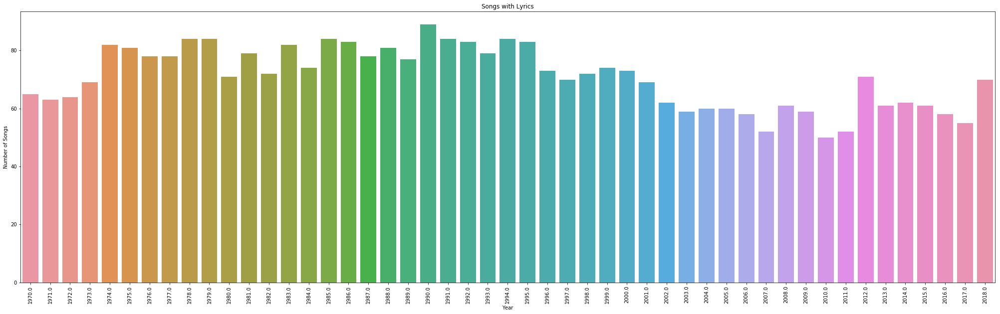

In [68]:
plot_year_counts(songs_with_lyrics_dataset, 'Year', 'Rank', 'Songs with Lyrics')
#plot_year_counts(all_songs, 'Year', 'Rank', 'All Songs Collected')

### Data Modelling
### Extracting Verbs, Nouns, and the Corpus

#### SpaCy

for this part of the experiment I used SpaCy (https://spacy.io/), a well known and fairly industrial grade Natural Language Processing library. I'm using the en_core_web_sm models as our Lyrics are almost exclusively engligh.
The add_spacy_data function will iterate through all lyrics, tokenize each word with SpaCy, then store the nouns, verbs, and lemma (root) words (without the stop words) into new columns in a new data set and then return the new dataset with columns ['Verbs'], ['Nouns'], ['Adverbs'], and ['Corpus'].

We'll use these columns extensively as we proceed through our inspection of the lyrics.

In [72]:
prepared_songs_dataset = add_spacy_data(songs_with_lyrics_dataset, 'Lyrics')

In [81]:
prepared_songs_dataset = prepared_songs_dataset.drop(columns = ['Unnamed: 0'])

In [91]:
word_counts = []
unique_word_counts = []
for i in range (0, len(prepared_songs_dataset)):
    word_counts.append(len(prepared_songs_dataset.iloc[i]['Lyrics'].split()))
    unique_word_counts.append(len(set(prepared_songs_dataset.iloc[i]['Lyrics'].split())))
prepared_songs_dataset['Word Counts'] = word_counts
prepared_songs_dataset['Unique Word Counts'] = unique_word_counts

In [92]:
prepared_songs_dataset.head(5)

,Album,Album URL,Artist,Featured Artists,Lyrics,Media,Rank,Release Date,Song Title,Song URL,Writers,Year,Verbs,Nouns,Adverbs,Corpus,Word Counts,Unique Word Counts
0,Bridge Over Troubled Water,https://genius.com/albums/Simon-and-garfunkel/...,Simon and Garfunkel,[],[Verse 1] When you're weary Feeling small When...,[{'native_uri': 'spotify:track:6l8EbYRtQMgKOyc...,1,1970-01-26,Bridge Over Troubled Water,https://genius.com/Simon-and-garfunkel-bridge-...,"[{'api_path': '/artists/15474', 'header_image_...",1970.0,be feel be will dry be get can be find will la...,verse tear eye side time friend bridge water b...,when when when just not when down out when whe...,verse 1 when be weary feel small when tear ey...,166,83
1,Close to You,https://genius.com/albums/Carpenters/Close-to-you,Carpenters,[],Why do birds suddenly appear Every time you ar...,[{'native_uri': 'spotify:track:79SE4x5ZROfEqaN...,2,1970-05-15,(They Long To Be) Close To You,https://genius.com/Carpenters-they-long-to-be-...,"[{'api_path': '/artists/412388', 'header_image...",1970.0,do appear be be do fall walk be be bear get de...,bird time star sky time day angel dream moondu...,why suddenly just long why by just long togeth...,why bird suddenly appear every time near just ...,200,72
3,Raindrops Keep Fallin' on My Head,https://genius.com/albums/Bj-thomas/Raindrops-...,B.J. Thomas,[],Raindrops keep fallin' on my head And just lik...,[{'native_uri': 'spotify:track:7BSIoadwe5hNIO1...,4,NaN,Raindrops Keep Fallin' On My Head,https://genius.com/Bj-thomas-raindrops-keep-fa...,"[{'api_path': '/artists/412388', 'header_image...",1970.0,keep be seem fit be keep do say do like get do...,raindrop fallin head guy foot bed nothing rain...,just too so just not there not not up not soon...,raindrop fallin head and like guy foot big bed...,182,85
4,War & Peace,https://genius.com/albums/Edwin-starr/War-peace,Edwin Starr,[],"[Intro] (War, what is it good for?) Absolutely...",[{'native_uri': 'spotify:track:7bfWzWm54GVlb8X...,5,1970-06-10,War,https://genius.com/Edwin-starr-war-lyrics,"[{'api_path': '/artists/326091', 'header_image...",1970.0,be be be be despise mean live mean go fight lo...,what nothing what nothing what nothing war som...,absolutely absolutely absolutely when absolute...,intro war good absolutely war good absolutely...,313,139
5,Diana Ross,https://genius.com/albums/Diana-ross/Diana-ross,Diana Ross,[],"[Verse 1:] Ah ah ah ah If you need me, call me...","[{'provider': 'youtube', 'start': 0, 'type': '...",6,1970-07-16,Ain't No Mountain High Enough,https://genius.com/Diana-ross-aint-no-mountain...,"[{'api_path': '/artists/193893', 'header_image...",1970.0,need call be call will be can depend worry see...,verse name hurry love seed thought need compan...,no matter where no matter how far just there n...,verse 1 ah ah ah ah if need no matter no matt...,335,166


In [93]:
prepared_songs_dataset.to_csv('prepped_data.csv')

In [94]:
display(prepared_songs_dataset.iloc[0])

Album                                        Bridge Over Troubled Water
Album URL             https://genius.com/albums/Simon-and-garfunkel/...
Artist                                              Simon and Garfunkel
Featured Artists                                                     []
Lyrics                [Verse 1] When you're weary Feeling small When...
Media                 [{'native_uri': 'spotify:track:6l8EbYRtQMgKOyc...
Rank                                                                  1
Release Date                                                 1970-01-26
Song Title                                   Bridge Over Troubled Water
Song URL              https://genius.com/Simon-and-garfunkel-bridge-...
Writers               [{'api_path': '/artists/15474', 'header_image_...
Year                                                               1970
Verbs                 be feel be will dry be get can be find will la...
Nouns                 verse tear eye side time friend bridge wat

In [100]:
display(prepared_songs_dataset.iloc[0]['Adverbs'])

'when when when just not when down out when when so hard when all around how right'

In [90]:
prepared_songs_dataset = pd.read_csv('prepped_data.csv', index_col=0)

## Evaluation Phase 1 - Word Counts and Repetition

In [95]:
summary_dataset = pd.DataFrame()
years = prepared_songs_dataset['Year'].unique().tolist()
for i in range(0, len(years)):
    row = {
        "Year": years[i],
        "Average Words": prepared_songs_dataset['Word Counts'][prepared_songs_dataset['Year'] == years[i]].mean(),
        "Unique Words": prepared_songs_dataset['Unique Word Counts'][prepared_songs_dataset['Year'] == years[i]].mean()
    }
    summary_dataset = summary_dataset.append(row, ignore_index=True)
summary_dataset["Year"] = summary_dataset['Year'].astype(int)

In [101]:
characteristics = prepared_songs_dataset.groupby('Year').count()

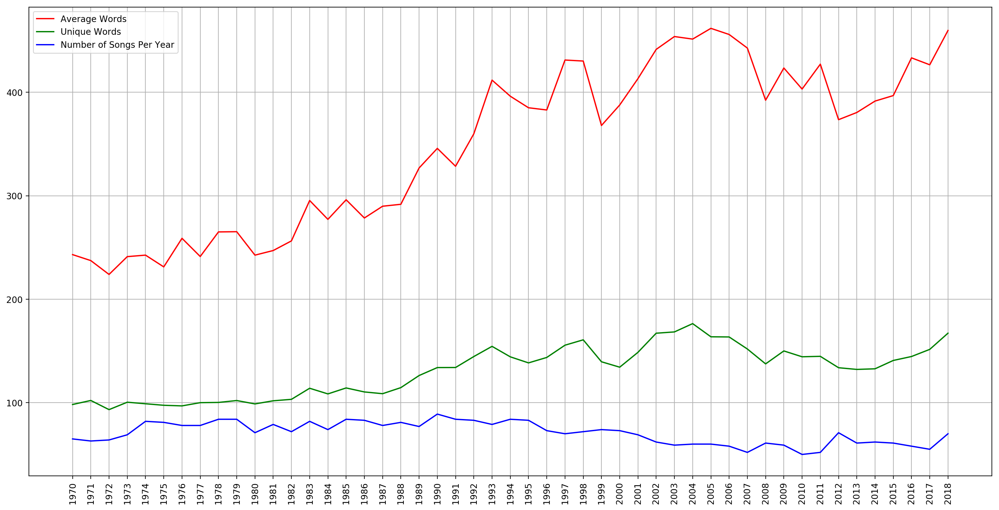

In [102]:
plt.figure(figsize=(20,10), dpi=200)
plt.plot(summary_dataset['Year'], summary_dataset['Average Words'].values, color="red", label="Average Words")
plt.plot(summary_dataset['Year'], summary_dataset['Unique Words'].values, color="green", label = "Unique Words")
plt.plot(characteristics['Rank'], color="blue", label = "Number of Songs Per Year")
plt.xticks(summary_dataset['Year'], rotation=90)
plt.grid()
plt.legend()
plt.show()

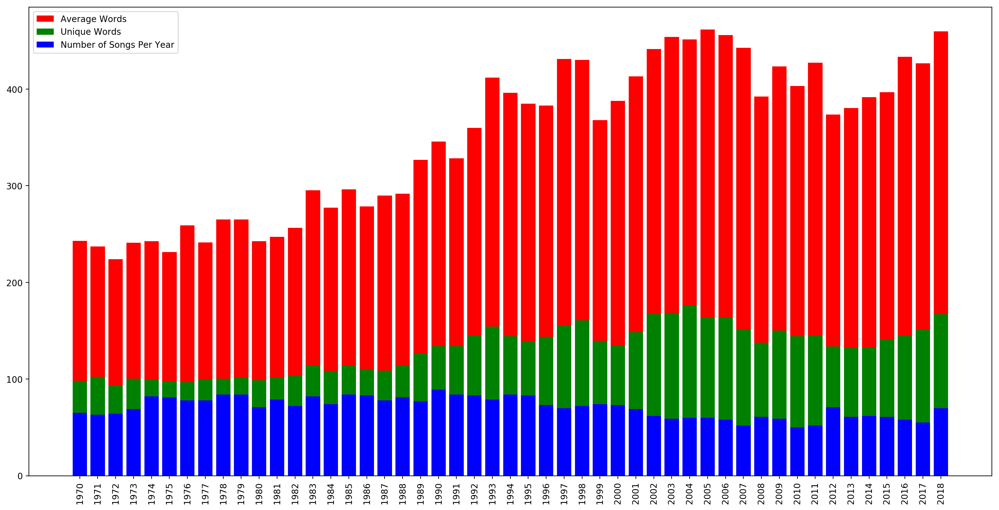

In [103]:
plt.figure(figsize=(20,10), dpi=200)
plt.bar(summary_dataset['Year'], summary_dataset['Average Words'].values, color="red", label="Average Words")
plt.bar(summary_dataset['Year'], summary_dataset['Unique Words'].values, color="green", label = "Unique Words")
plt.bar(summary_dataset['Year'], characteristics['Rank'], color="blue", label = "Number of Songs Per Year")
plt.xticks(summary_dataset['Year'], rotation=90)
plt.legend()
plt.show()

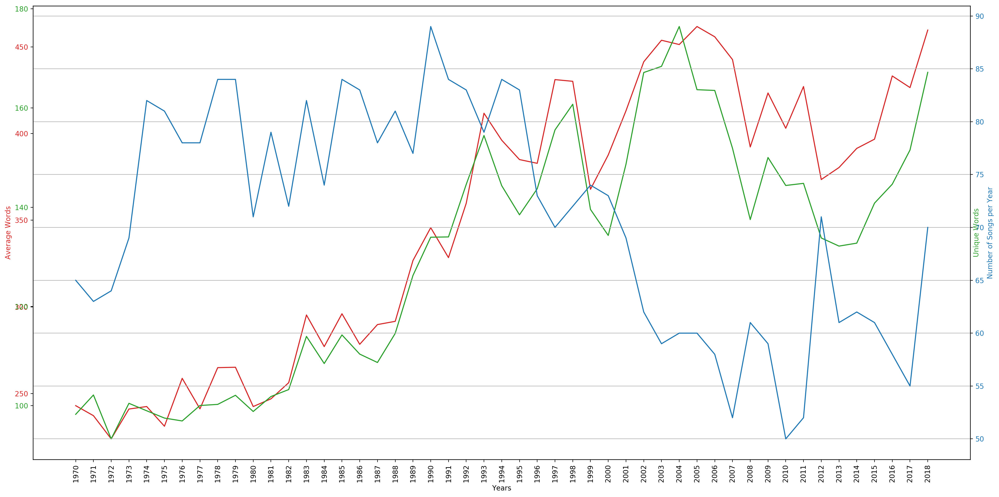

In [104]:
fig, ax1 = plt.subplots(figsize=(20,10), dpi=200)
#plt.figure(figsize = (20,15))

color = 'tab:red'
ax1.set_xlabel('Years')
ax1.set_ylabel('Average Words', color=color)
ax1.plot(summary_dataset['Year'], summary_dataset['Average Words'].values, color=color)
ax1.tick_params(axis='y', labelcolor=color)
plt.xticks(summary_dataset['Year'], rotation=90)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:green'
ax2.set_ylabel('Unique Words', color=color)  # we already handled the x-label with ax1
ax2.plot(summary_dataset['Year'], summary_dataset['Unique Words'].values, color=color)
ax2.tick_params(axis='y', labelcolor=color)

color = 'tab:blue'
ax3 = ax2.twinx()  # instantiate a second axes that shares the same x-axis
ax3.set_ylabel("Number of Songs per Year", color = color)
ax3.plot(characteristics['Rank'])
ax3.tick_params(axis='y', labelcolor=color)
#plt.plot(characteristics['Rank'])
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.xticks(summary_dataset['Year'], rotation=90)

plt.grid()
plt.show()

In [115]:
prepared_songs_dataset[prepared_songs_dataset['Year'] == 2004].sort_values(by=['Unique Word Counts'], ascending=False).head(10)

,Album,Album URL,Artist,Featured Artists,Lyrics,Media,Rank,Release Date,Song Title,Song URL,Writers,Year,Verbs,Nouns,Adverbs,Corpus,Word Counts,Unique Word Counts
3458,D12 World,https://genius.com/albums/D12/D12-world,D12,[],"[Intro: Eminem] I don't know, dude I think eve...","[{'provider': 'youtube', 'start': 34, 'type': ...",59,2004-03-14,My Band,https://genius.com/D12-my-band-lyrics,"[{'api_path': '/artists/558736', 'header_image...",2004.0,do know dude think be shit be think be get dud...,everybody singer band dude everybody problem s...,not all not even all so all all now especially...,intro eminem I not know dude I think everybod...,1114,469
3460,I'm Good,https://genius.com/albums/Kanye-west/I-m-good,Kanye West,[],[Music Video] [Produced by Kanye West] [Intro...,"[{'provider': 'youtube', 'start': 0, 'type': '...",61,2003-09-30,Through the Wire,https://genius.com/Kanye-west-through-the-wire...,"[{'api_path': '/artists/412398', 'header_image...",2004.0,produce can stop can can be would risk come ma...,rappin fire limit wall chance fire what chance...,not gladly right even there too right now glad...,music video produce kanye west intro yo gee n...,775,371
3493,Happy People/U Saved Me,https://genius.com/albums/R-kelly/Happy-people...,R. Kelly,[],[Intro] Ladies and gentlemen This here is anot...,[{'native_uri': 'spotify:track:51ohTObAvYM3lxK...,94,2004-08-24,Happy People,https://genius.com/R-kelly-happy-people-lyrics,"[{'api_path': '/artists/535', 'header_image_ur...",2004.0,be put tell do do step do do dress step do go ...,lady gentleman one record whoa what playin gro...,here when when when where soon here why away n...,intro lady gentleman this steppas dj wayne wi...,994,362
3409,True Story,https://genius.com/albums/Terror-squad/True-story,Terror Squad,"[{'api_path': '/artists/83', 'header_image_url...","[Intro: Fat Joe] Owwwwww! Yeah! My niggas, aha...",[{'native_uri': 'spotify:track:2Ozc0me9PV5vlt8...,10,NaN,Lean Back,https://genius.com/Terror-squad-lean-back-lyrics,"[{'api_path': '/artists/10233', 'header_image_...",2004.0,ahah throw feel see show love do give mishappe...,niggas hand air shit fuck fault clappin place ...,right now right here nigga nigga not nigga sti...,intro fat joe owwwwww yeah My niggas ahah thr...,666,333
3497,Encore,https://genius.com/albums/Eminem/Encore,Eminem,[],[Intro: Eminem] Down down down Down down down ...,"[{'provider': 'youtube', 'start': 0, 'type': '...",98,2004-09-28,Just Lose It,https://genius.com/Eminem-just-lose-it-lyrics,"[{'api_path': '/artists/59345', 'header_image_...",2004.0,guess be tell report report stop come guess be...,who friend everyone dance floor dance floor da...,down down down down down down down down down b...,intro eminem down down down down okay guess b...,747,326
3490,The Black Album,https://genius.com/albums/Jay-z/The-black-album,Jay-Z,[],"[Intro: Jay-Z (Pharrell)] Wooo! Uh, uh, bounce...","[{'provider': 'youtube', 'start': 0, 'type': '...",91,2003-11-04,Change Clothes,https://genius.com/Jay-z-change-clothes-lyrics,"[{'api_path': '/artists/26832', 'header_image_...",2004.0,be be know miss need bounce let get be be be b...,bounce boy bounce sexy dude world truth who pr...,back back back back not back just where where ...,intro jay z pharrell wooo uh uh bounce uhh uh...,713,320
3430,Kamikaze,https://genius.com/albums/Twista/Kamikaze,Twista,[],[Produced by Kanye West] [Intro: Twista] Oh y...,[{'native_uri': 'spotify:track:2tOZtdbkAMQASWo...,31,2004-01-27,Overnight Celebrity,https://genius.com/Twista-overnight-celebrity-...,"[{'api_path': '/artists/74', 'header_image_url...",2004.0,produce do think could do can make know be say...,baby celebrity what something hoes'll drive wh...,not again even why not overnight overnight sti...,produce kanye west intro twista oh not think ...,900,309
3413,Still Writing in My Diary: 2nd Entry,https://genius.com/albums/Petey-pablo/Still-wr...,Petey Pablo,[],[Intro] [DJ Petey Pablo] Let's take some call...,"[{'provider': 'youtube', 's

In [ ]:
prepared_songs_dataset[prepared_songs_dataset['Year'] == 2005].sort_values(by=['Word Counts'], ascending=False).head(10)

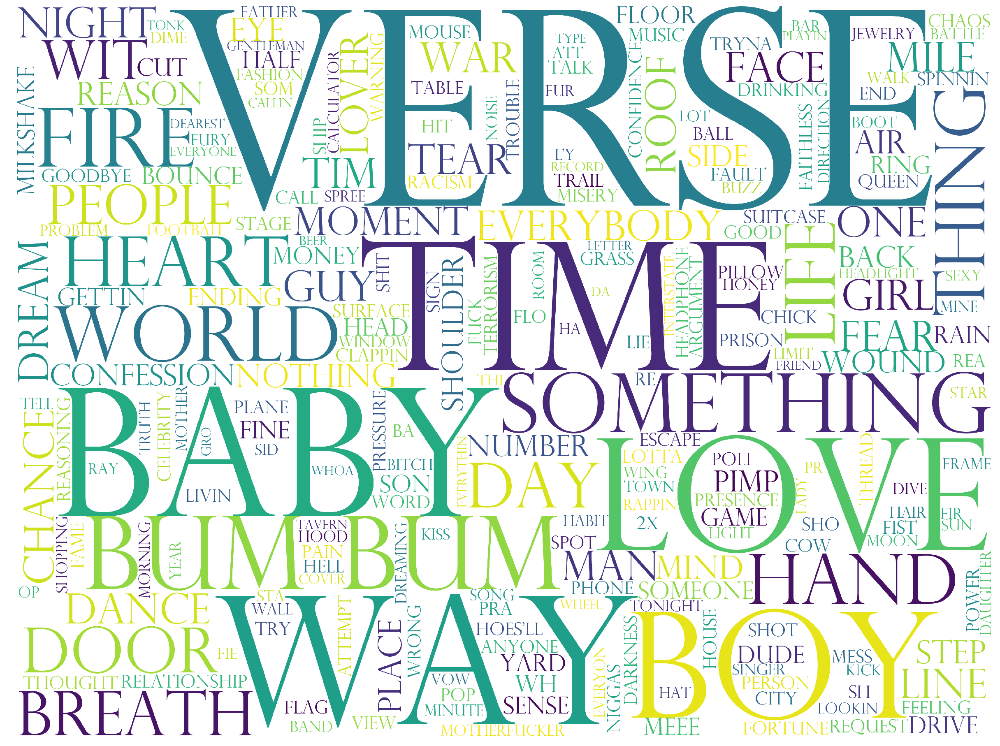

In [124]:
wordcloud(str(prepared_songs_dataset['Nouns'][prepared_songs_dataset['Year'] == 2004]), 250)

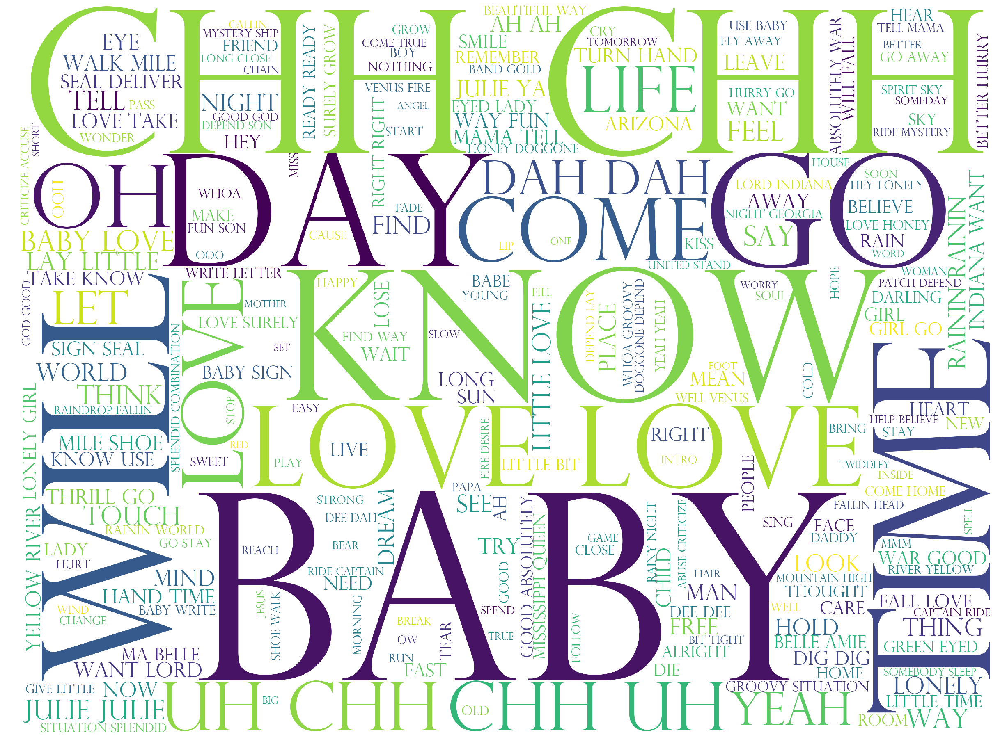

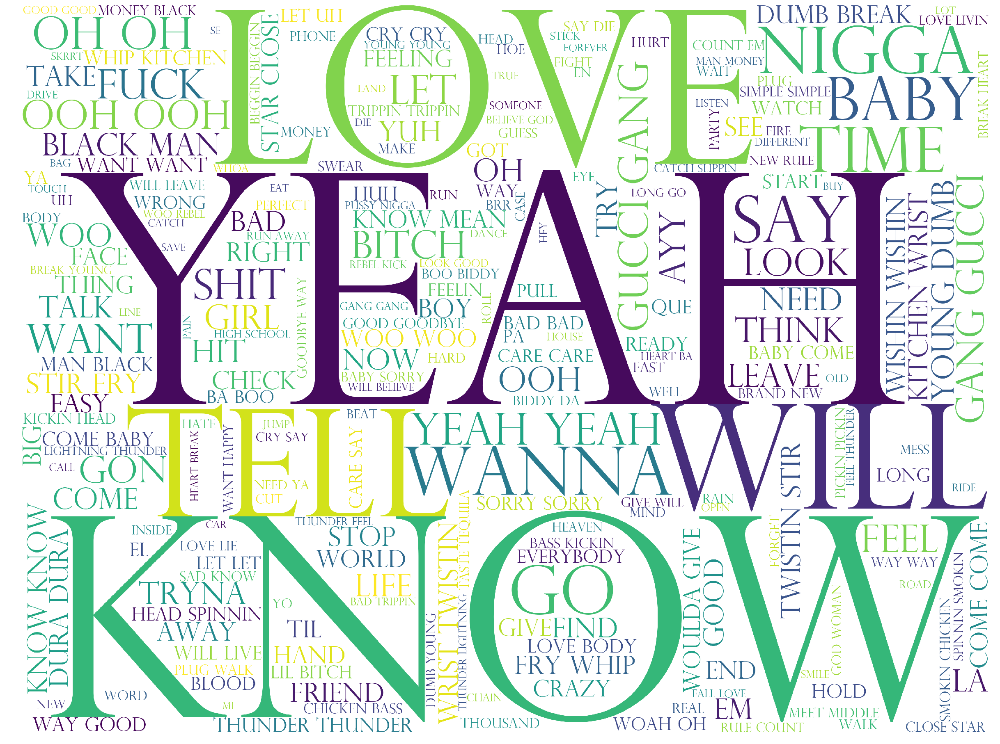

In [98]:
wordcloud(str(prepared_songs_dataset['Corpus'][prepared_songs_dataset['Year'] == 1970].tolist()),250)
wordcloud(str(prepared_songs_dataset['Corpus'][prepared_songs_dataset['Year'] == 2018].tolist()),250)

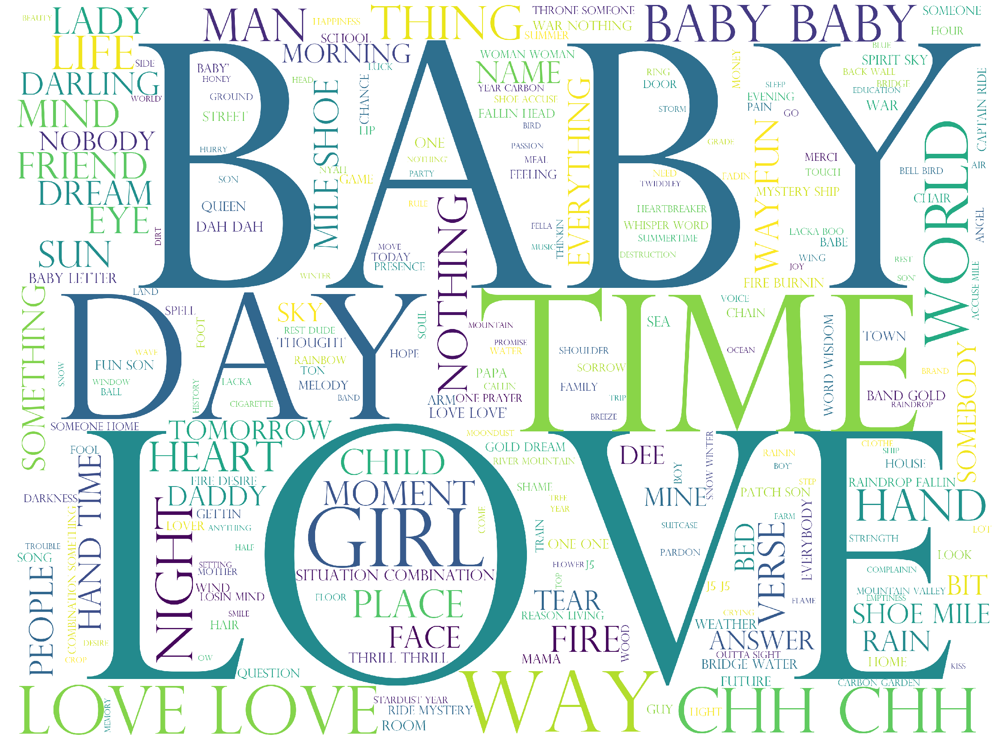

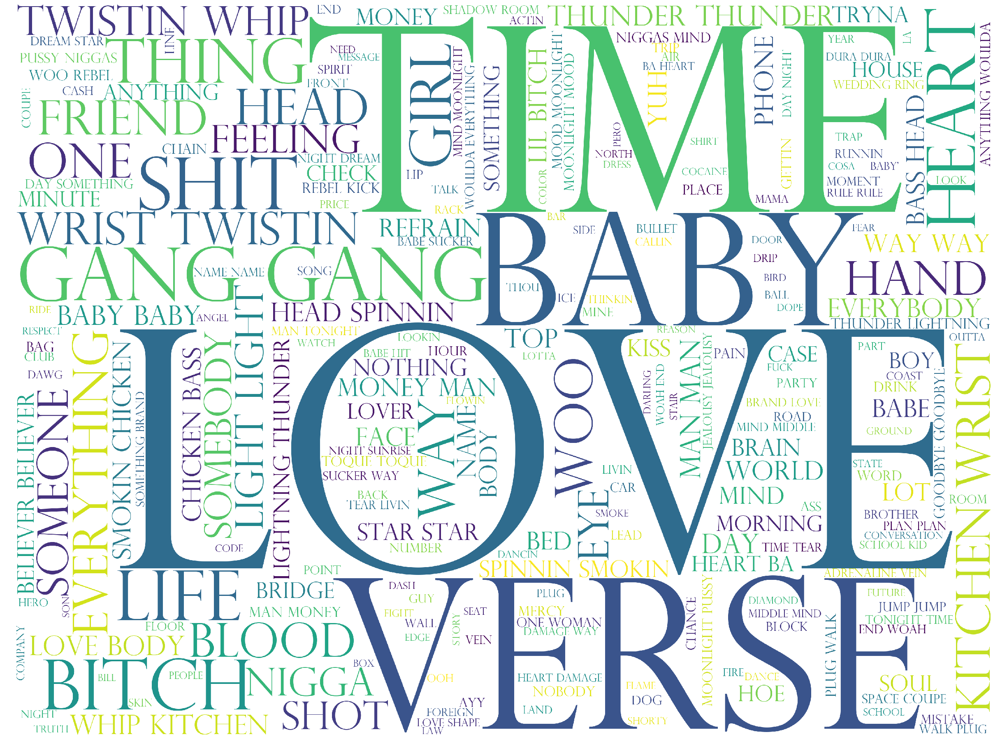

In [120]:
wordcloud(str(prepared_songs_dataset['Nouns'][prepared_songs_dataset['Year'] == 1970].tolist()),250)
wordcloud(str(prepared_songs_dataset['Nouns'][prepared_songs_dataset['Year'] == 2018].tolist()),250)

## Calculating Term Frequencies

In [125]:
word_frequencies = pd.DataFrame()
for i in range (0, len(years)):
    year_corpus = str(prepared_songs_dataset['Corpus'][prepared_songs_dataset['Year'] == years[i]].tolist())
    tokens = year_corpus.split(" ")
    counts = Counter(tokens)
    word_frequencies = word_frequencies.append({
        "Year": years[i],
        "Most Common Words": counts.most_common(n=100)
    }, ignore_index=True)
word_frequencies['Year'] = word_frequencies['Year'].astype(int)

In [126]:
adverb_frequencies = map_popular_terms(prepared_songs_dataset, "Adverbs", "Year")
noun_frequencies = map_popular_terms(prepared_songs_dataset, "Nouns", "Year")
verb_frequencies = map_popular_terms(prepared_songs_dataset, "Verbs", "Year")
word_frequencies = map_popular_terms(prepared_songs_dataset, "Corpus", "Year")

In [127]:
common_adverbs = map_common_words(adverb_frequencies)
common_nouns = map_common_words(noun_frequencies)
common_words = map_common_words(word_frequencies)
common_verbs = map_common_words(verb_frequencies)

In [128]:
common_adverb_counts = get_common_frequency(common_adverbs, adverb_frequencies)
common_noun_counts = get_common_frequency(common_nouns, noun_frequencies)
common_verb_counts = get_common_frequency(common_verbs, verb_frequencies)
common_word_counts = get_common_frequency(common_words, word_frequencies)

In [149]:
top_five_nouns = []
for i in range (0, len(noun_frequencies)):
    for j in range (0, 10):
        top_five_nouns.append(noun_frequencies.iloc[i]['Most Common Terms'][j][0])
top_five_nouns = " ".join(top_five_nouns)
top_five_nouns = re.sub("what", "", top_five_nouns)


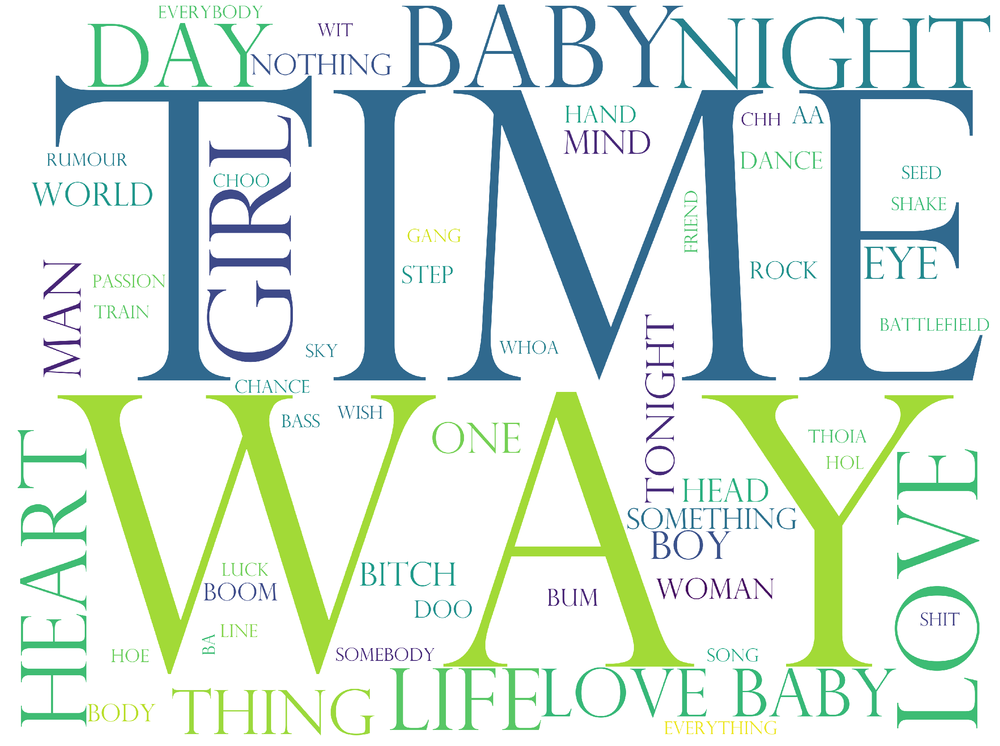

In [150]:
wordcloud(top_five_nouns, max_words=100)

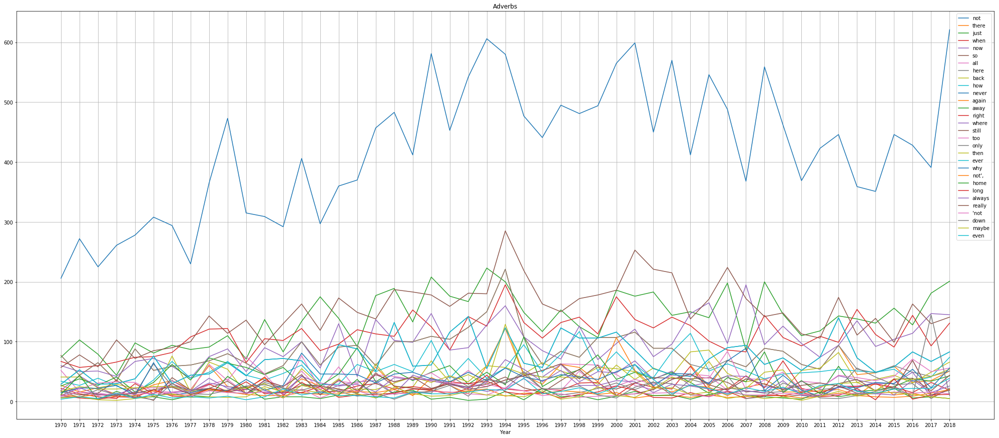

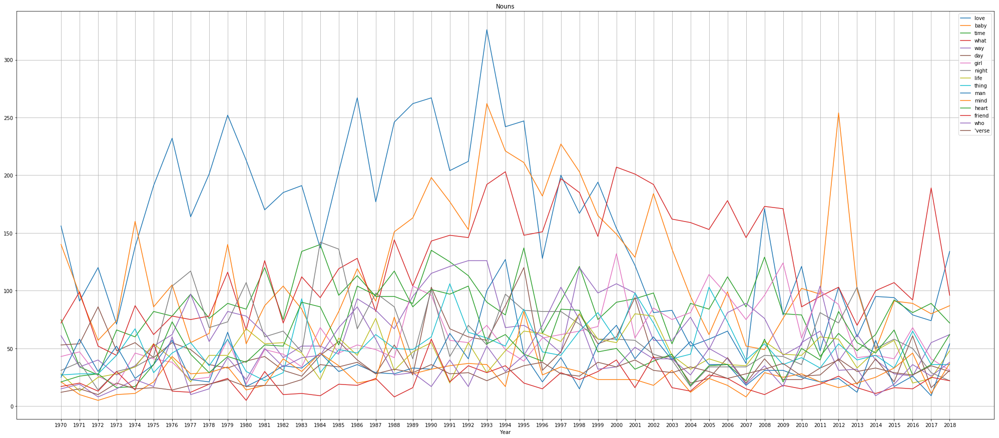

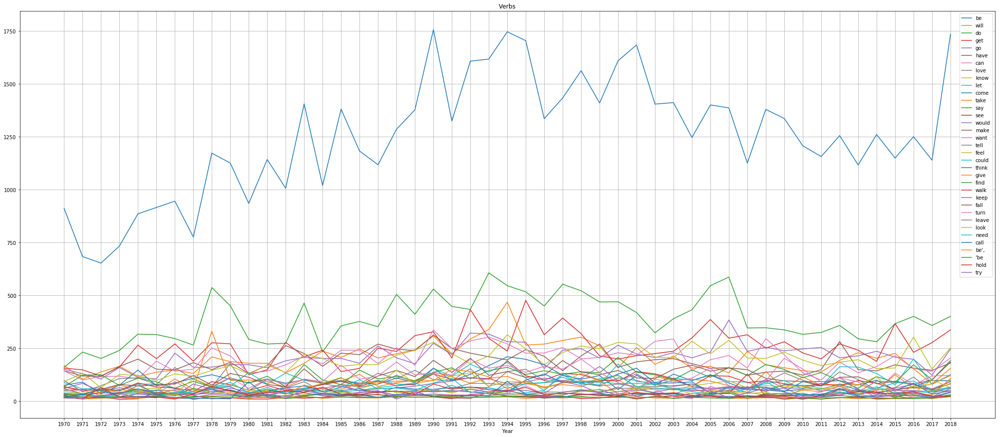

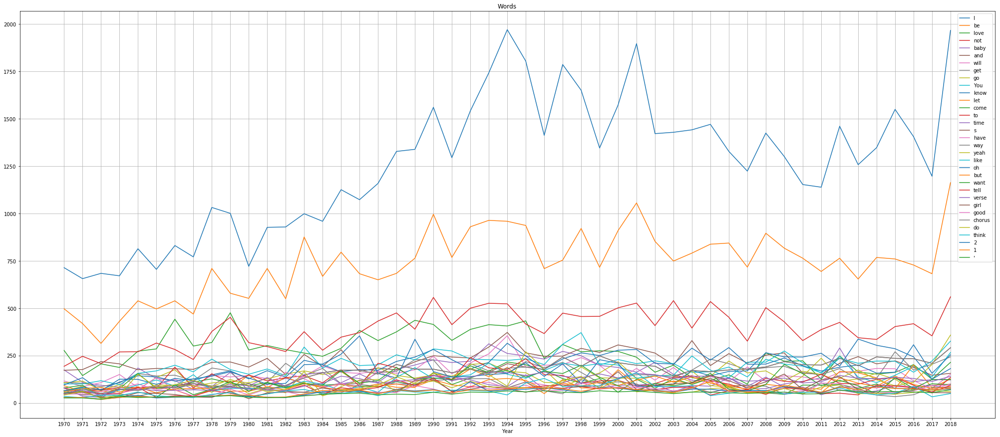

In [130]:
common_adverb_counts.plot(figsize=(35,15), title="Adverbs", grid="true", xticks=common_adverb_counts.index)
common_noun_counts.plot(figsize=(35,15), title="Nouns", grid="true", xticks=common_noun_counts.index)
common_verb_counts.plot(figsize=(35,15), title="Verbs", grid="true", xticks=common_verb_counts.index)
common_word_counts.plot(figsize=(35,15), title="Words", grid="true", xticks=common_word_counts.index)
plt.show()

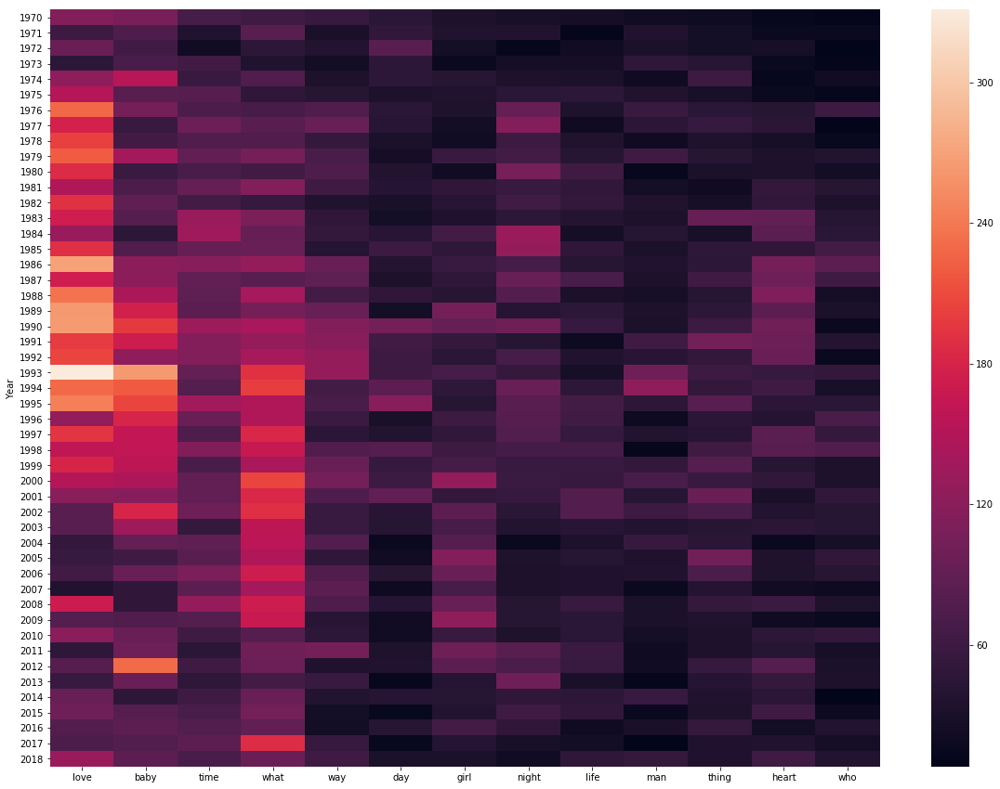

In [26]:
plt.figure(figsize=(20,15))
sns.heatmap(data=common_noun_counts)
plt.show()

## Analysis 2 - Profanity in Lyrics
Here we load the facebook bad words list from freewebheaders.com and compare it to our lyrics.
I tried using set here, but couldn't get it to go, so I reverted to a for loop.

In [151]:
bad_word_file = 'facebook-bad-words-list_comma-separated-text-file_2018_07_29.txt'
with open(bad_word_file) as f:
    bad_words_list = f.read().split(",")

In [152]:
len(bad_words_list)

1697

In [177]:
bad_words_per_song = []
for i in range (0, len(prepared_songs_dataset)):
    bad_words_found = []
    for bad_word in bad_words_list:
        if bad_word in prepared_songs_dataset.iloc[i]['Corpus']:
            print("Found bad word in record: {}".format(i), end="\r")
            bad_words_found.append(bad_word)
    bad_words_per_song.append(bad_words_found)

In [178]:
prepared_songs_dataset['Bad Words'] = bad_words_per_song
prepared_songs_dataset.to_csv("final_prepped_dataset.csv")

In [179]:
prepared_songs_dataset = pd.read_csv("final_prepped_dataset.csv", index_col=0)

In [180]:
prepared_songs_dataset.head()

,Album,Album URL,Artist,Featured Artists,Lyrics,Media,Rank,Release Date,Song Title,Song URL,Writers,Year,Verbs,Nouns,Adverbs,Corpus,Word Counts,Unique Word Counts,Bad Words,# Bad Words
0,Bridge Over Troubled Water,https://genius.com/albums/Simon-and-garfunkel/...,Simon and Garfunkel,[],[Verse 1] When you're weary Feeling small When...,[{'native_uri': 'spotify:track:6l8EbYRtQMgKOyc...,1,1970-01-26,Bridge Over Troubled Water,https://genius.com/Simon-and-garfunkel-bridge-...,"[{'api_path': '/artists/15474', 'header_image_...",1970.0,be feel be will dry be get can be find will la...,verse tear eye side time friend bridge water b...,when when when just not when down out when whe...,verse 1 when be weary feel small when tear ey...,166,83,[],17
1,Close to You,https://genius.com/albums/Carpenters/Close-to-you,Carpenters,[],Why do birds suddenly appear Every time you ar...,[{'native_uri': 'spotify:track:79SE4x5ZROfEqaN...,2,1970-05-15,(They Long To Be) Close To You,https://genius.com/Carpenters-they-long-to-be-...,"[{'api_path': '/artists/412388', 'header_image...",1970.0,do appear be be do fall walk be be bear get de...,bird time star sky time day angel dream moondu...,why suddenly just long why by just long togeth...,why bird suddenly appear every time near just ...,200,72,[],17
3,Raindrops Keep Fallin' on My Head,https://genius.com/albums/Bj-thomas/Raindrops-...,B.J. Thomas,[],Raindrops keep fallin' on my head And just lik...,[{'native_uri': 'spotify:track:7BSIoadwe5hNIO1...,4,NaN,Raindrops Keep Fallin' On My Head,https://genius.com/Bj-thomas-raindrops-keep-fa...,"[{'api_path': '/artists/412388', 'header_image...",1970.0,keep be seem fit be keep do say do like get do...,raindrop fallin head guy foot bed nothing rain...,just too so just not there not not up not soon...,raindrop fallin head and like guy foot big bed...,182,85,[],17
4,War & Peace,https://genius.com/albums/Edwin-starr/War-peace,Edwin Starr,[],"[Intro] (War, what is it good for?) Absolutely...",[{'native_uri': 'spotify:track:7bfWzWm54GVlb8X...,5,1970-06-10,War,https://genius.com/Edwin-starr-war-lyrics,"[{'api_path': '/artists/326091', 'header_image...",1970.0,be be be be despise mean live mean go fight lo...,what nothing what nothing what nothing war som...,absolutely absolutely absolutely when absolute...,intro war good absolutely war good absolutely...,313,139,[],17
5,Diana Ross,https://genius.com/albums/Diana-ross/Diana-ross,Diana Ross,[],"[Verse 1:] Ah ah ah ah If you need me, call me...","[{'provider': 'youtube', 'start': 0, 'type': '...",6,1970-07-16,Ain't No Mountain High Enough,https://genius.com/Diana-ross-aint-no-mountain...,"[{'api_path': '/artists/193893', 'header_image...",1970.0,need call be call will be can depend worry see...,verse name hurry love seed thought need compan...,no matter where no matter how far just there n...,verse 1 ah ah ah ah if need no matter no matt...,335,166,[],17


In [181]:
num_bad_words = []
for i in range (0, len(prepared_songs_dataset)):
    num_bad_words.append(len(prepared_songs_dataset.iloc[i]['Bad Words']))
prepared_songs_dataset['# Bad Words'] = num_bad_words

In [182]:
summary_bad_words = pd.DataFrame()
for i in range (0, len(years)):
    bad_words_per_year = sum(prepared_songs_dataset['# Bad Words'][prepared_songs_dataset['Year'] == years[i]])
    songs_with_bad_words_per_year = sum(prepared_songs_dataset['# Bad Words'][prepared_songs_dataset['Year'] == years[i]] > 3)

    row = {
        "Year": years[i],
        "Bad Words": bad_words_per_year,
        "Songs with Bad Words":songs_with_bad_words_per_year
    }
    summary_bad_words = summary_bad_words.append(row, ignore_index = True)
summary_bad_words['Year'] = summary_bad_words['Year'].astype(int)
summary_bad_words['Songs Per Year'] = characteristics['Rank'].values.tolist()
summary_bad_words.set_index('Year', inplace=True)

In [183]:
prepared_songs_dataset.iloc[0]['Bad Words'][1]

']'

In [210]:
summary_bad_words.head()

,Bad Words,Songs with Bad Words,Songs Per Year
Year,,,
1970,215.0,11.0,65
1971,289.0,13.0,63
1972,230.0,12.0,64
1973,385.0,22.0,69
1974,542.0,19.0,82


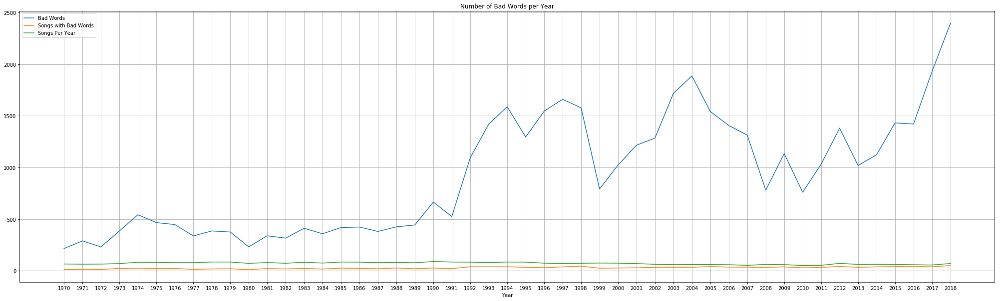

In [185]:
summary_bad_words.plot(title = "Number of Bad Words per Year", figsize=(35,10), grid = True, xticks=summary_bad_words.index)
plt.show()

## Evaluation Phase 2 - Predicting Aggressive Songs.
### Loading the Aggression Model
#### ENSURE YOU HAVE RUN THE AGGRESSION CLASSIFIER NOTEBOOK FIRST !

## Deploying the Model from Aggression Classifier

In [186]:
json_file = open('82pct_aggression_detectioon_keras_model.json')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
loaded_model.load_weights("82pct_aggression_detectioon_keras_weights.h5")
print("Loaded model from disk")

Loaded model from disk


In [187]:
cv = pickle.load(open("cv.pickle", "rb"))

In [188]:
aggression_prediction_classification = []
aggression_prediction_confidence = []
for i in range (0, len(prepared_songs_dataset)):
    print("Processing record {}".format(i), end = "\r")
    lyrics_to_compare = prepared_songs_dataset.iloc[i]['Corpus']
    #test_text = prep_corpus(test_text)
    lyrics_cv = cv.transform([lyrics_to_compare]).toarray()
    results_classification = loaded_model.predict_classes([lyrics_cv])
    results_confidence = loaded_model.predict([lyrics_cv])
    aggression_prediction_classification.append(results_classification[0][0])
    aggression_prediction_confidence.append(results_confidence[0][0])

In [189]:
prepared_songs_dataset['Aggression Prediction'] = aggression_prediction_classification
prepared_songs_dataset['Aggression Prediction Confidence'] = aggression_prediction_confidence

In [190]:
summary_aggression = pd.DataFrame()
for i in range (0, len(years)):
    aggressive_songs_per_year = sum(prepared_songs_dataset['Aggression Prediction'][prepared_songs_dataset['Year'] == years[i]])
    #aggressive_songs_per_year = sum(prepared_songs_dataset['# Bad Words'][prepared_songs_dataset['Year'] == years[i]] > 0)
    row = {
        "Year": years[i],
        "# Aggressive Songs":aggressive_songs_per_year
    }
    summary_aggression = summary_aggression.append(row, ignore_index = True)
summary_aggression['Year'] = summary_aggression['Year'].astype(int)
summary_aggression['Songs Per Year'] = characteristics['Rank'].values.tolist()
summary_aggression.set_index('Year', inplace=True)

In [207]:
prepared_songs_dataset.tail(5)

,Album,Album URL,Artist,Featured Artists,Lyrics,Media,Rank,Release Date,Song Title,Song URL,...,Verbs,Nouns,Adverbs,Corpus,Word Counts,Unique Word Counts,Bad Words,# Bad Words,Aggression Prediction,Aggression Prediction Confidence
4893,? (Question Mark),https://genius.com/albums/Xxxtentacion/Questio...,XXXTENTACION,"[{'api_path': '/artists/248458', 'header_image...","[Chorus: XXXTENTACION] Mmm, baby , I don't und...","[{'provider': 'youtube', 'start': 0, 'type': '...",94,2018-03-02,Changes,https://genius.com/Xxxtentacion-changes-lyrics,...,do understand be change can stand can take fee...,baby heart damage way baby heart damage way ba...,not not not not not not not not not not not no...,chorus xxxtentacion mmm baby I not understand...,199,37,"[' xx', ' xxx']",15,0,0.0
4894,Brett Young,https://genius.com/albums/Brett-young/Brett-young,Brett Young,[],[Verse 1] Mercy Why you gotta show up lookin' ...,"[{'provider': 'youtube', 'start': 0, 'type': '...",95,2017-02-10,Mercy,https://genius.com/Brett-young-mercy-lyrics,...,get show hurt stop turn hang be work stop be b...,verse mercy lookin world mercy flame heart sho...,why so just why wanna why so tight not why wan...,verse 1 mercy why get to lookin good hurt why...,243,83,"[' damn', ' drunk']",19,0,0.0
4895,This One's For You,https://genius.com/albums/Luke-combs/This-one-...,Luke Combs,[],"[Verse 1] Are you sitting at home, all alone, ...","[{'provider': 'youtube', 'start': 0, 'type': '...",96,2016-09-29,One Number Away,https://genius.com/Luke-combs-one-number-away-...,...,be sit try fall be star pray ring be watch hav...,verse home hole phone movie time line anything...,all alone maybe just just wanna away when not ...,verse 1 be sit home try fall asleep be star h...,394,151,[],2,0,0.0
4897,Dua Lipa,https://genius.com/albums/Dua-lipa/Dua-lipa,Dua Lipa,[],[Verse 1] You call me all friendly Tellin' me ...,[{'native_uri': 'spotify:track:76cy1WJvNGJTj78...,98,2017-06-02,IDGAF,https://genius.com/Dua-lipa-idgaf-lyrics,...,call miss be guess have hear be go find want l...,verse song business girl who yesterday love mo...,how much too so not already enough on not so u...,verse 1 You friendly tellin miss that be funn...,453,153,"[' damn', ' fuc', ' fuck', ' fuck']",35,0,0.0
4899,Evolve,https://genius.com/albums/Imagine-dragons/Evolve,Imagine Dragons,[],[Verse 1] First things first I'ma say all the ...,"[{'provider': 'youtube', 'start': 0, 'type': '...",100,2017-02-01,Believer,https://genius.com/Imagine-dragons-believer-ly...,...,be be fire have be have be do tell think could...,verse thing say word head way thing way thing ...,first second not above never ever til open nev...,verse 1 first thing I be word inside head I b...,415,159,[],2,0,0.0


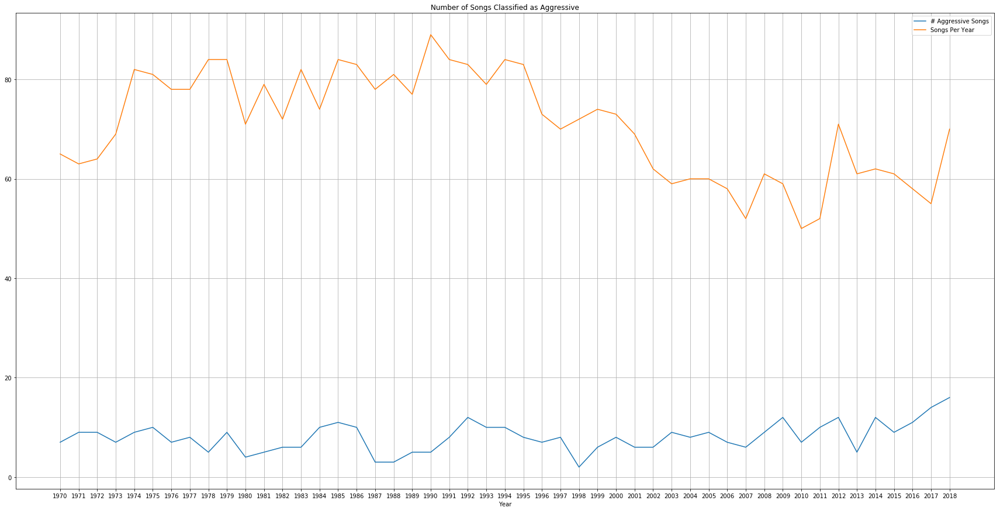

In [191]:
summary_aggression.plot(figsize=(30,15), grid=True, title = "Number of Songs Classified as Aggressive", xticks=summary_aggression.index)
#summary_bad_words.plot(title = "Number of Bad Words per Year", figsize=(35,10), grid = True, xticks=summary_bad_words.index)
plt.show()

In [194]:
summary_aggression.head()

,# Aggressive Songs,Songs Per Year
Year,,
1970,7.0,65
1971,9.0,63
1972,9.0,64
1973,7.0,69
1974,9.0,82


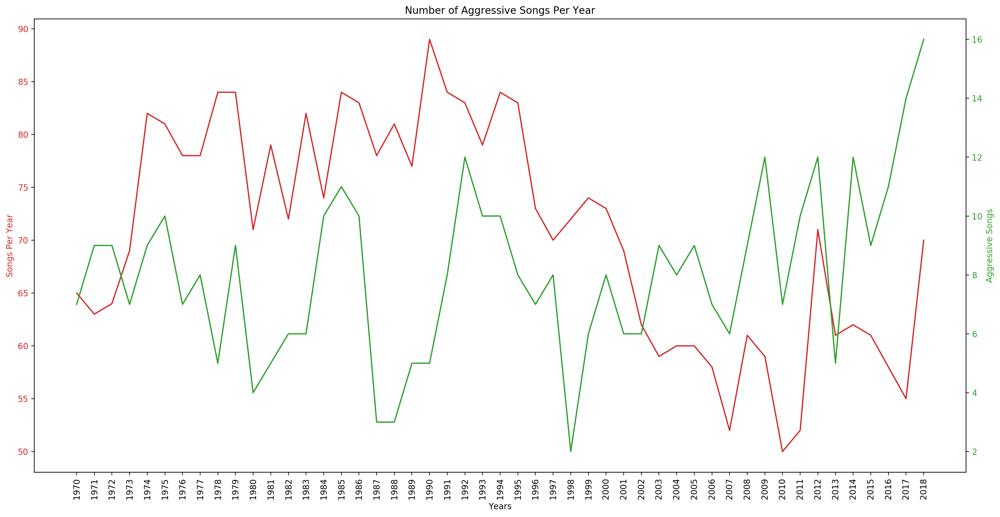

In [208]:
fig, ax1 = plt.subplots(figsize=(20,10), dpi=200)
#plt.figure(figsize = (20,15))

color = 'tab:red'
ax1.set_xlabel('Years')
ax1.set_ylabel('Songs Per Year', color=color)
ax1.plot(characteristics.index, summary_aggression['Songs Per Year'],  color=color)
ax1.tick_params(axis='y', labelcolor=color)
plt.xticks(summary_dataset['Year'], rotation=90)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:green'
ax2.set_ylabel('Aggressive Songs', color=color)  # we already handled the x-label with ax1
ax2.plot(characteristics.index, summary_aggression['# Aggressive Songs'], color=color)
ax2.tick_params(axis='y', labelcolor=color)


plt.grid(axis='x')
plt.title("Number of Aggressive Songs Per Year")
plt.show()

## Conclusions
I revisited the ~~hypothesis~~ Business Understanding/problem to see what we’ve learned.

* Word quantity and language complexity has increased from 1970 to 2018.
 * Supported. We can see that by measure of frequency and uniqueness that the lyrics have become complex.
* Several common nouns appear throughout the entire spectrum of lyrics, but the most common ones change over time.
 * Supported. We now know that Love lost value in 1996, but never truly went away. And Baby had it’s best years in 1993 and 2012.
* Adverbs have become more aggressive/forward over time.
 * Not Supported. I didn’t even graph this because the data was so inconclusive. Feel free to take a look at this git repo and explore.
* Profanity in Lyrics has increased significantly in the past 20 years (1998 to 2018).
 * Supported. With 2018 being the most profane year on record.
* Songs are more aggressive now than they were in the 1970s.
 * Possibly Supported. We’re suspicious of the accuracy of our ANN (82% on it’s own data) vs the Lyrics dataset, but it does support the need for more research.